<a href="https://colab.research.google.com/github/Y4S1-Deep-Learning/Leaf-Desease-Detection---Supervised-Learning/blob/kaushalya/SSD/SSD_Mobilenet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Install Tensorflow Object detection Dependencies**

In [ ]:
!pip uninstall Cython -y
!git clone --depth 1 https://github.com/tensorflow/models

Found existing installation: Cython 3.0.2
Uninstalling Cython-3.0.2:
  Successfully uninstalled Cython-3.0.2
Cloning into 'models'...
remote: Enumerating objects: 3994, done.
remote: Counting objects: 100% (3994/3994), done.
remote: Compressing objects: 100% (3106/3106), done.
remote: Total 3994 (delta 1153), reused 1971 (delta 831), pack-reused 0
Receiving objects: 100% (3994/3994), 49.78 MiB | 15.69 MiB/s, done.
Resolving deltas: 100% (1153/1153), done.


In [ ]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

In [ ]:
import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.8.0', s)
    f.write(s)

In [ ]:
# Install the Object Detection API
!pip install pyyaml==5.3
!pip install /content/models/research/
!pip install tensorflow==2.8.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.2/268.2 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.3-cp310-cp310-linux_x86_64.whl size=44243 sha256=dcc4d70024df4d2a68690c8c6c5ca8b86e4ee5b998b5590036165c30f4e04c82
  Stored in directory: /root/.cache/pip/wheels/0d/72/68/a263cfc14175636cf26bada99f13b735be1b60a11318e08bfc
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2023.8.1 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is incompatible.
distributed 2023.8.1 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is incompatible.
flax 0.7.4 requires PyYAML>=5.4.1, but you have pyyaml 5.3 which is incompatible.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 497.6/497.6 MB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.5/462.5 kB 44.6 MB/s eta 0:00:00
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.1
    Uninstalling tensorflow-2.8.1:
      Successfully uninstalled tensorflow-2.8.1


In [ ]:
# Run Model Bulider Test file
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py


/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrINS5_4

**Upload Dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!cp /content/drive/MyDrive/DL_ASS/SSD/PlantDoc.v1-resize-416x416.voc.zip /content

In [ ]:
!mkdir /content/images
!unzip -q PlantDoc.v1-resize-416x416.voc.zip -d /content/images/

**Create TFRecords**

In [ ]:
%%bash
cat <<EOF >> /content/labelmap.txt
Blueberry_leaf
Tomato_leaf_yellow_virus
Peach_leaf
Raspberry_leaf
Strawberry_leaf
Tomato_Septoria_leaf_spot
Tomato_leaf
Corn_leaf_blight
Bell_pepper_leaf
Potato_leaf_early_blight
Tomato_mold_leaf
Tomato_leaf_bacterial_spot
Soyabean_leaf
Bell_pepper_leaf_spot
Tomato_leaf_mosaic_virus
Squash_Powdery_mildew_leaf
Apple_leaf
Potato_leaf_late_blight
Cherry_leaf
grape_leaf
Tomato_leaf_late_blight
Tomato_Early_blight_leaf
Apple_rust_leaf
Apple_Scab_Leaf
grape_leaf_black_rot
Corn_rust_leaf
Corn_Gray_leaf_spot
Soybean_leaf
Potato_leaf
Tomato_two_spotted_spider_mites_leaf
EOF

In [ ]:
# Download data conversion scripts
! wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py
! wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py
#! wget https://github.com/Y4S1-Deep-Learning/Leaf-Desease-Detection---Supervised-Learning/blob/kaushalya/SSD/create_csv.py
#! wget https://github.com/Y4S1-Deep-Learning/Leaf-Desease-Detection---Supervised-Learning/blob/kaushalya/SSD/create_tfrecord.py

--2023-10-05 19:10:43--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1348 (1.3K) [text/plain]
Saving to: ‘create_csv.py’

create_csv.py       100%[===================>]   1.32K  --.-KB/s    in 0s      

2023-10-05 19:10:43 (106 MB/s) - ‘create_csv.py’ saved [1348/1348]

--2023-10-05 19:10:43--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.github

**Remove spaces in annotations <name>**

In [ ]:
import os
import xml.etree.ElementTree as ET

In [ ]:
# Define the directory, XML files are located -- train data
xml_directory = '/content/images/train/'

for filename in os.listdir(xml_directory):
    if filename.endswith('.xml'):
        xml_path = os.path.join(xml_directory, filename)

        tree = ET.parse(xml_path)
        root = tree.getroot()

        #remove spaces of <name> elements
        for name_elem in root.iter('name'):
            name_elem.text = name_elem.text.replace(" ", "_")

        # Save the modified XML in the file
        tree.write(xml_path)


In [ ]:
# Define the directory, XML files are located -- test data
xml_directory = '/content/images/test/'

for filename in os.listdir(xml_directory):
    if filename.endswith('.xml'):
        xml_path = os.path.join(xml_directory, filename)

        tree = ET.parse(xml_path)
        root = tree.getroot()

         #remove spaces of <name> elements
        for name_elem in root.iter('name'):
            name_elem.text = name_elem.text.replace(" ", "_")

        # Save the modified XML in the file
        tree.write(xml_path)

In [ ]:
# Create CSV data files and TFRecord files
!python3 create_csv.py

Successfully converted xml to csv.
Successfully converted xml to csv.


In [ ]:
!python3 create_tfrecord.py --csv_input=images/train_labels.csv --labelmap=labelmap.txt --image_dir=images/train --output_path=train.tfrecord

Successfully created the TFRecords: /content/train.tfrecord


In [ ]:
!python3 create_tfrecord.py --csv_input=images/validation_labels.csv --labelmap=labelmap.txt --image_dir=images/test --output_path=test.tfrecord

Successfully created the TFRecords: /content/test.tfrecord


In [ ]:
train_records = '/content/train.tfrecord'
test_records = '/content/test.tfrecord'
label_map_pbtxt_fname = '/content/labelmap.pbtxt'

**Training**

In [ ]:
model = 'ssd-mobilenet-v2-fpnlite-320'

MODELS_CONFIG = {
    'ssd-mobilenet-v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    },
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },
}

model_name = MODELS_CONFIG[model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[model]['base_pipeline_file']

In [ ]:
#download pre trained model
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download pre-trained model weights
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download training configuration file for model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2023-10-05 19:13:05--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.253.118.207, 74.125.200.207, 74.125.130.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|172.253.118.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  9.39MB/s    in 2.1s    

2023-10-05 19:13:08 (9.39 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

--2023-10-05 19:13:08--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185

In [ ]:
# Set training parameters for the model
num_steps = 45000

batch_size = 16

In [ ]:
# Set file locations
#get no.of classes
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)

Total classes: 30


In [ ]:
# Create custom configuration file by writing the dataset, model checkpoint, and training parameters into the base pipeline file
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    train_record_fname = "/content/train.tfrecord"
    val_record_fname = "/content/test.tfrecord"


    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/test)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    # If using ssd-mobilenet-v2, reduce learning rate (because it's too high in the default config file)
    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)

      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)

    # If using efficientdet-d0, use fixed_shape_resizer instead of keep_aspect_ratio_resizer (because it isn't supported by TFLite)
    if chosen_model == 'efficientdet-d0':
      s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
      s = re.sub('pad_to_max_dimension: true', '', s)
      s = re.sub('min_dimension', 'height', s)
      s = re.sub('max_dimension', 'width', s)

    f.write(s)

/content/models/mymodel
writing custom configuration file


In [ ]:
#Display the configuration file
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 30
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator 

In [ ]:
# Set the path to the custom config file
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

**Train the model**

In [ ]:
!kill 74657

In [ ]:
 %reload_ext tensorboard

In [ ]:
#%reload_ext tensorboard
%tensorboard --logdir '/content/training/train'

Reusing TensorBoard on port 6006 (pid 74657), started 0:01:08 ago. (Use '!kill 74657' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
!tensorboard --logdir=/path/to/logs --port=6007



NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.8.0 at http://localhost:6007/ (Press CTRL+C to quit)
^C


In [ ]:
# Run training!
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

Streaming output truncated to the last 5000 lines.
 'Loss/regularization_loss': 0.15109837,
 'Loss/total_loss': 0.8783685,
 'learning_rate': 0.079527386}
I1005 19:41:53.852048 133264523195008 model_lib_v2.py:708] {'Loss/classification_loss': 0.4594029,
 'Loss/localization_loss': 0.26786724,
 'Loss/regularization_loss': 0.15109837,
 'Loss/total_loss': 0.8783685,
 'learning_rate': 0.079527386}
INFO:tensorflow:Step 3500 per-step time 0.312s
I1005 19:42:25.089941 133264523195008 model_lib_v2.py:705] Step 3500 per-step time 0.312s
INFO:tensorflow:{'Loss/classification_loss': 0.38942164,
 'Loss/localization_loss': 0.1591294,
 'Loss/regularization_loss': 0.15118617,
 'Loss/total_loss': 0.6997372,
 'learning_rate': 0.07948727}
I1005 19:42:25.090304 133264523195008 model_lib_v2.py:708] {'Loss/classification_loss': 0.38942164,
 'Loss/localization_loss': 0.1591294,
 'Loss/regularization_loss': 0.15118617,
 'Loss/total_loss': 0.6997372,
 'learning_rate': 0.07948727}
INFO:tensorflow:Step 3600 per-s

**Convert the model to Tensorflow Lite**

In [ ]:
# Make a directory to store the trained TFLite model
!mkdir /content/lite_model
output_loc = '/content/lite_model'

# Path to training directory
last_model = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model} \
    --output_directory {output_loc} \
    --pipeline_config_path {pipeline_file}

/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrINS5_4

In [ ]:
# Convert exported graph file into TFLite model file
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/lite_model/saved_model')
tflite_model = converter.convert()

with open('/content/lite_model/detect.tflite', 'wb') as f:
  f.write(tflite_model)

**Test Model**

In [ ]:
# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

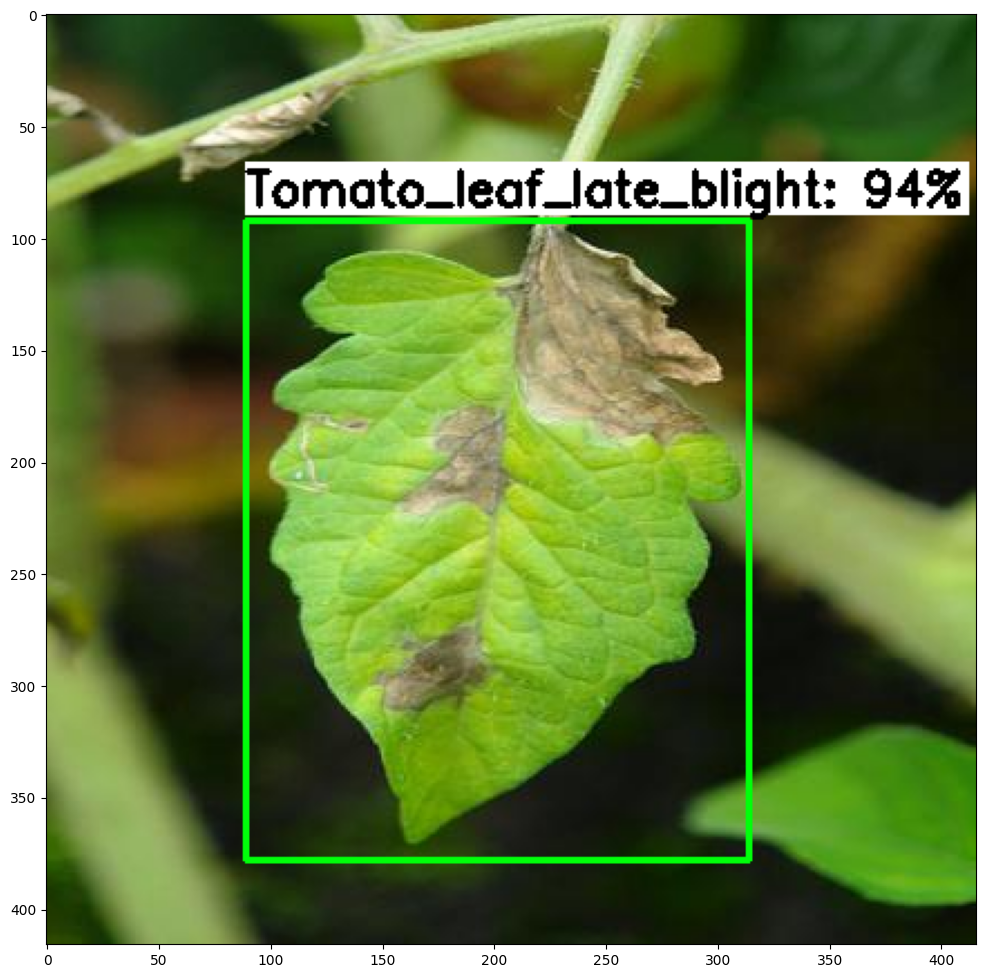

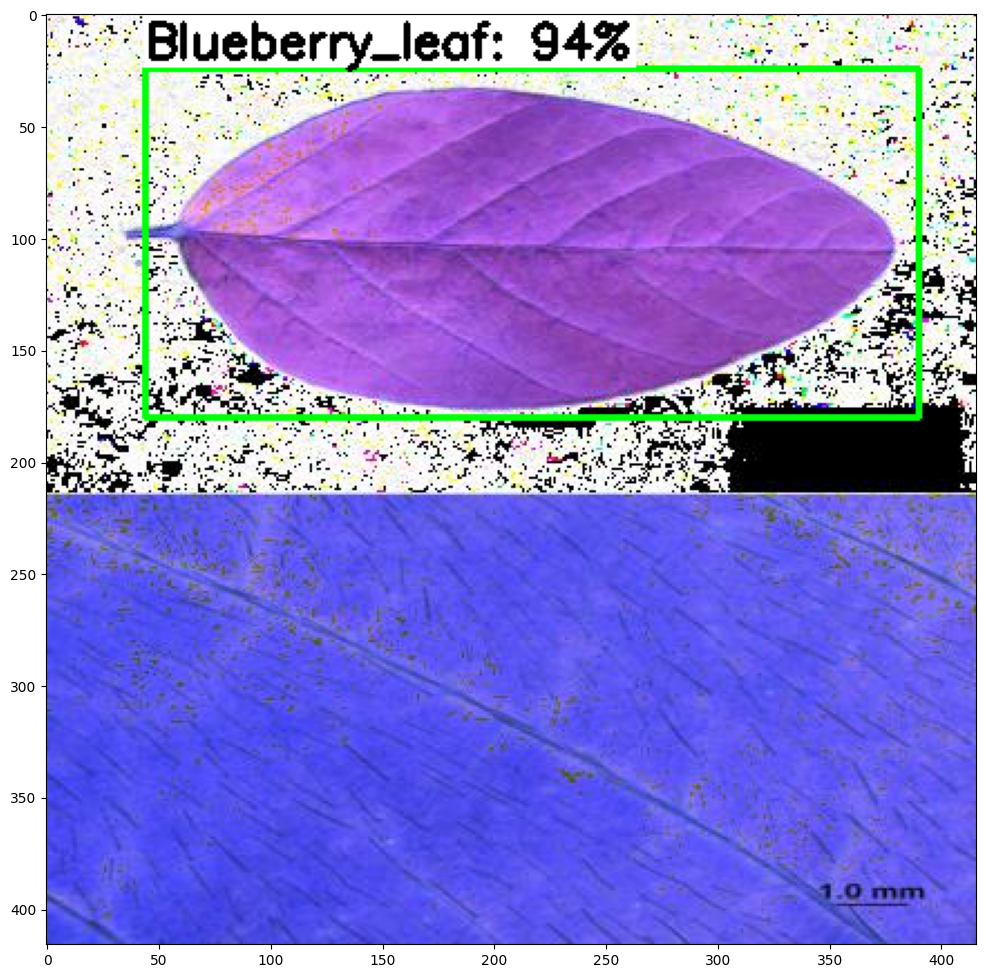

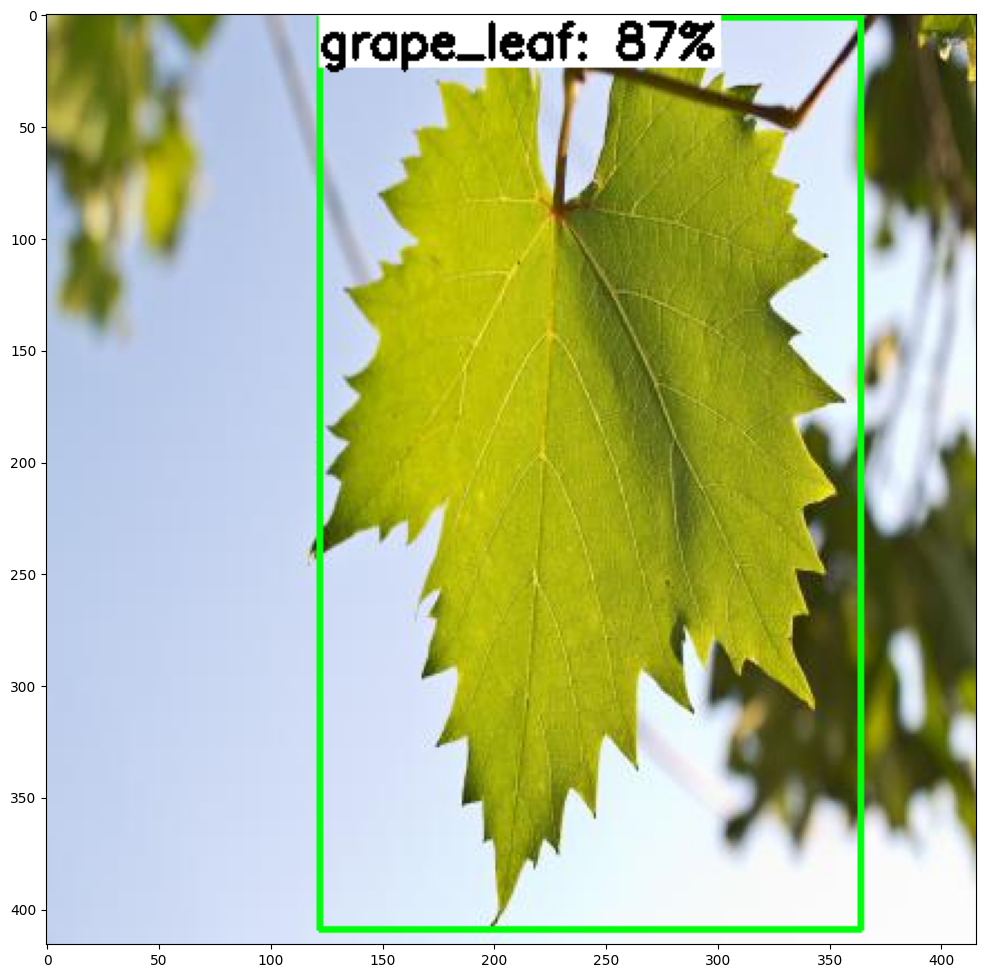

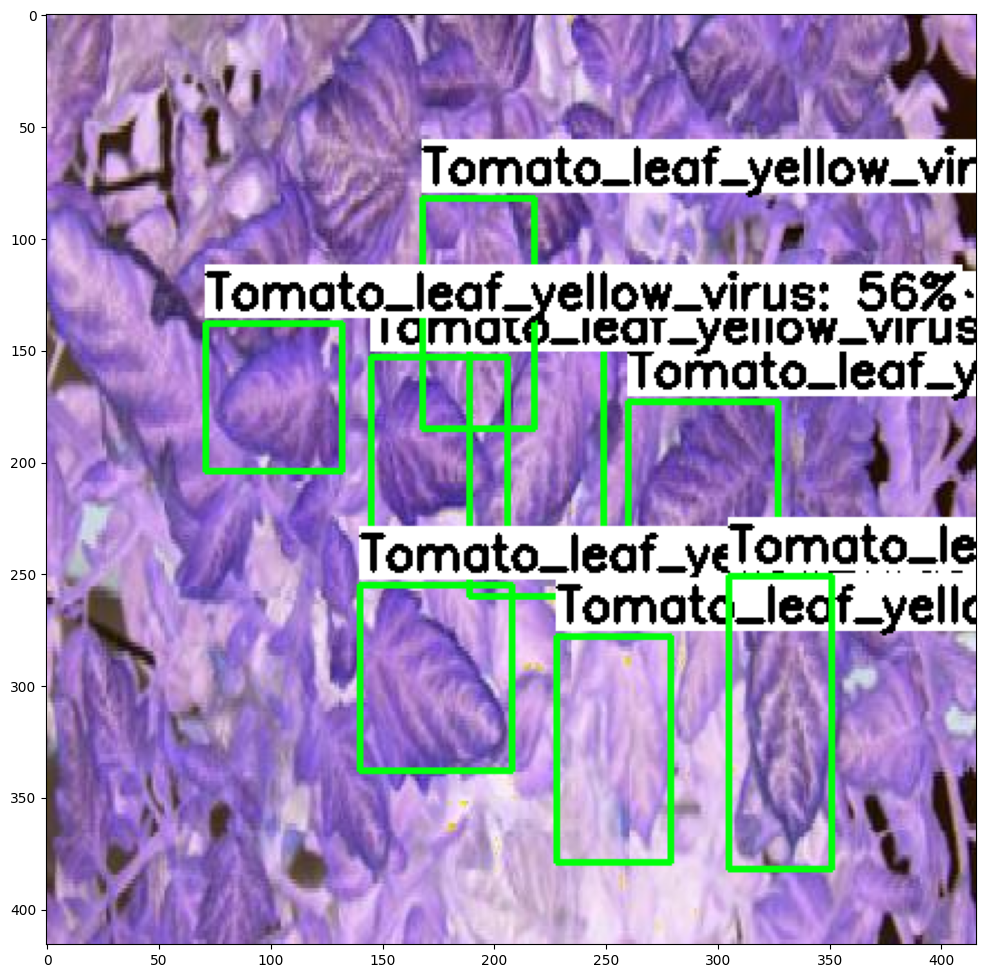

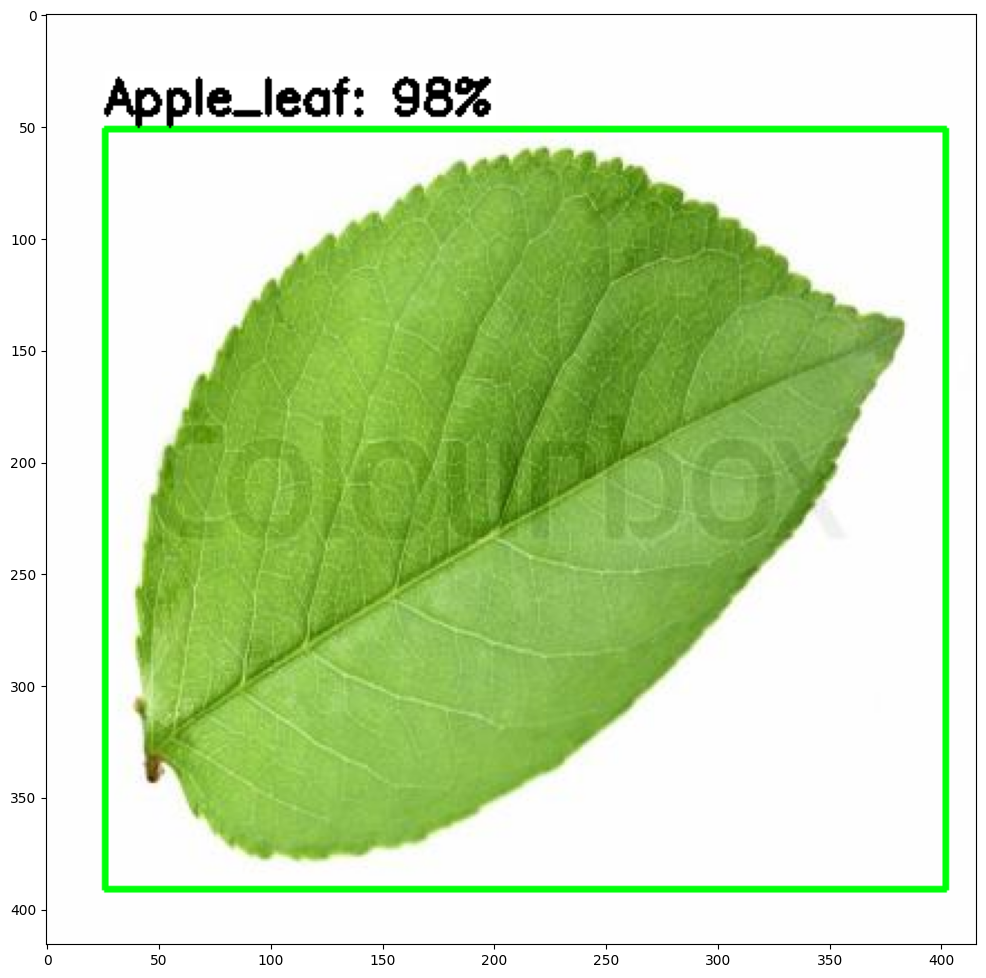

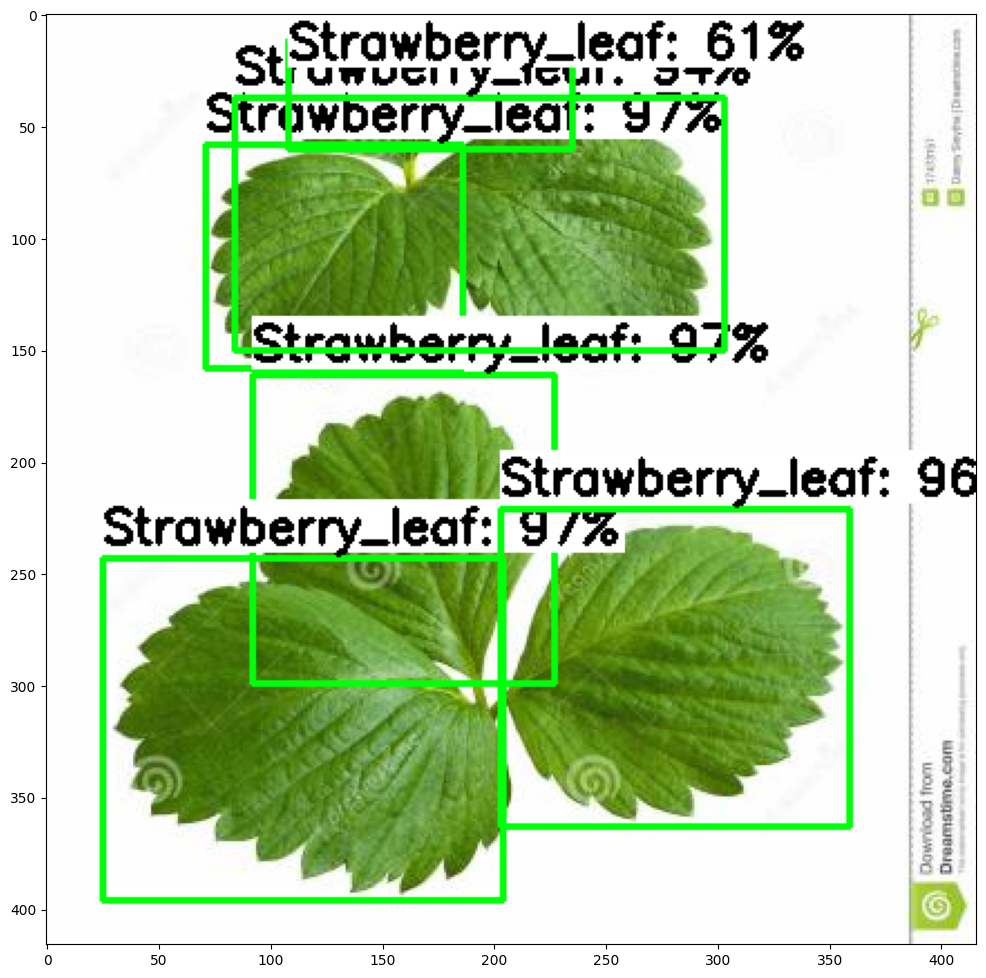

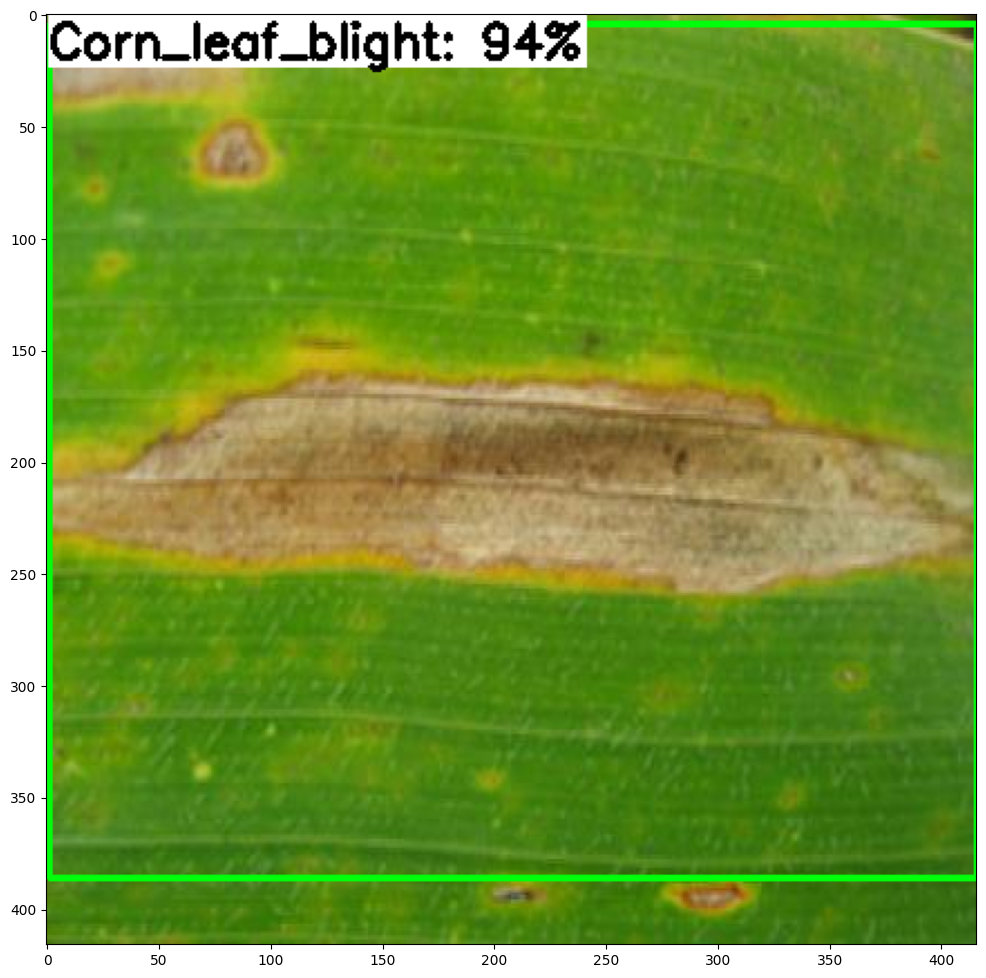

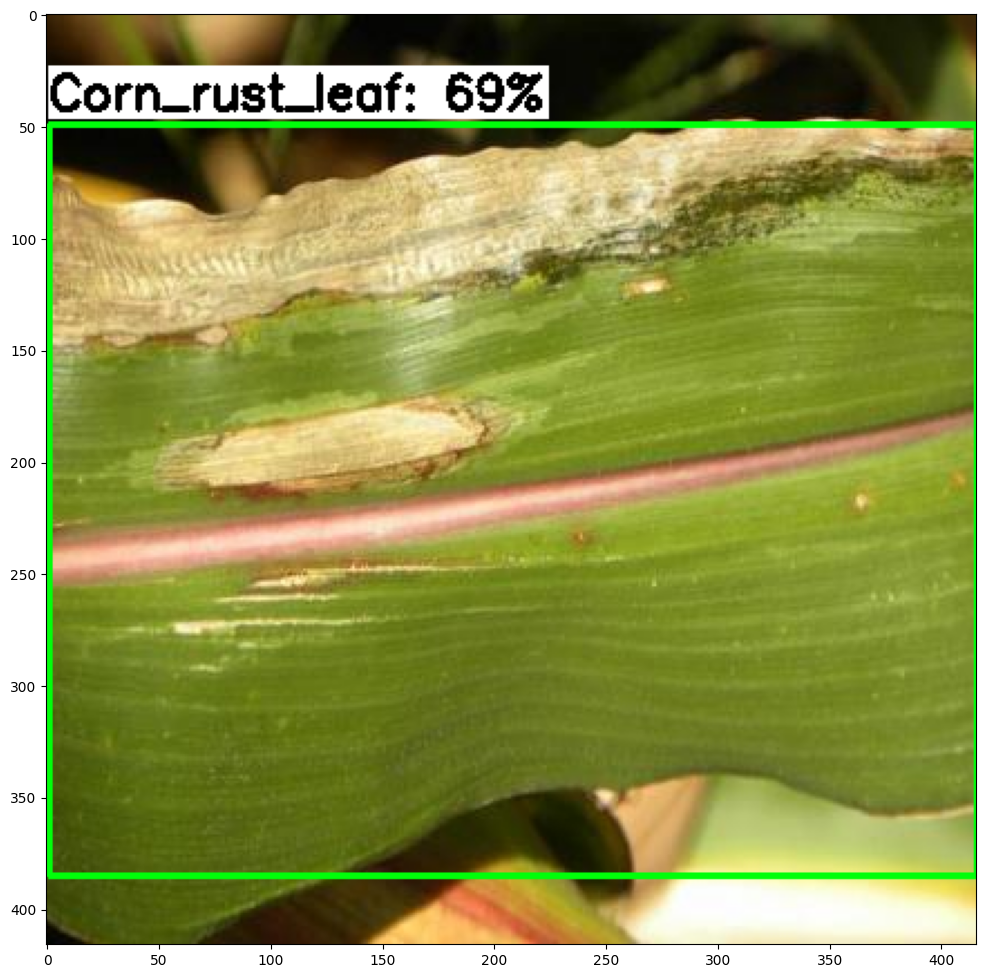

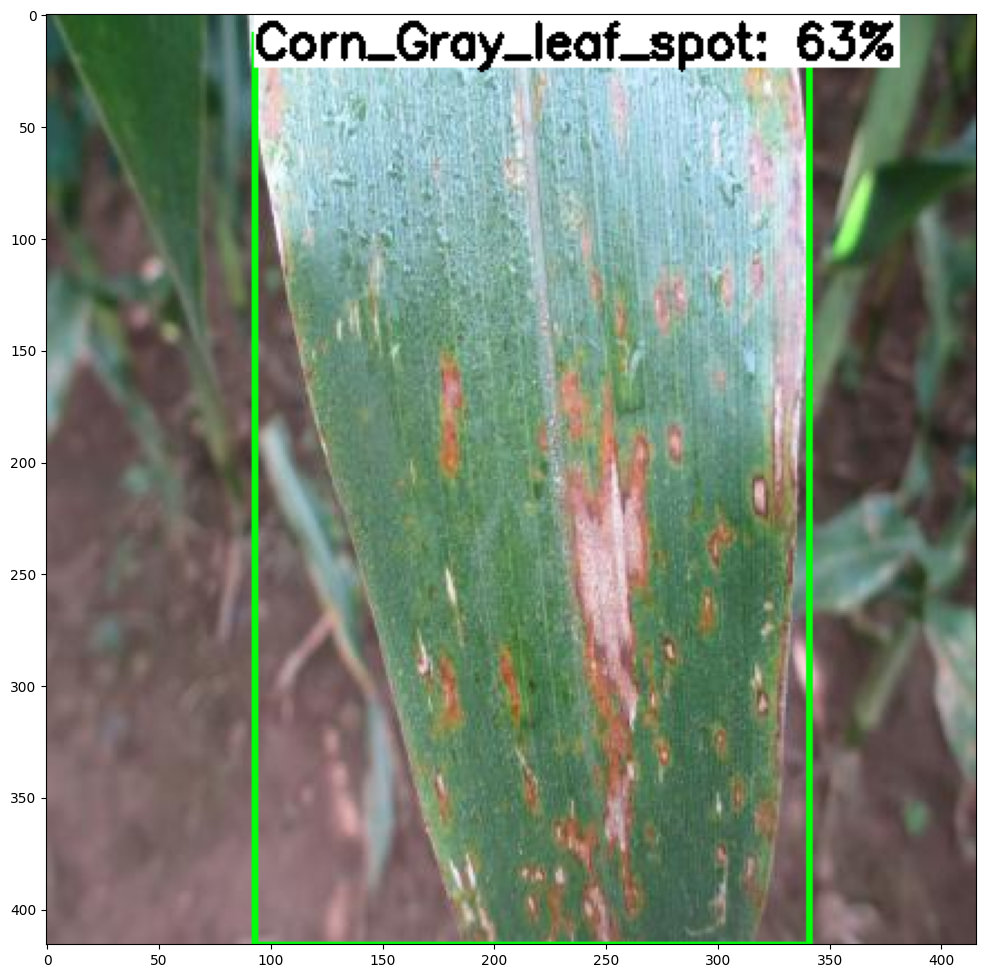

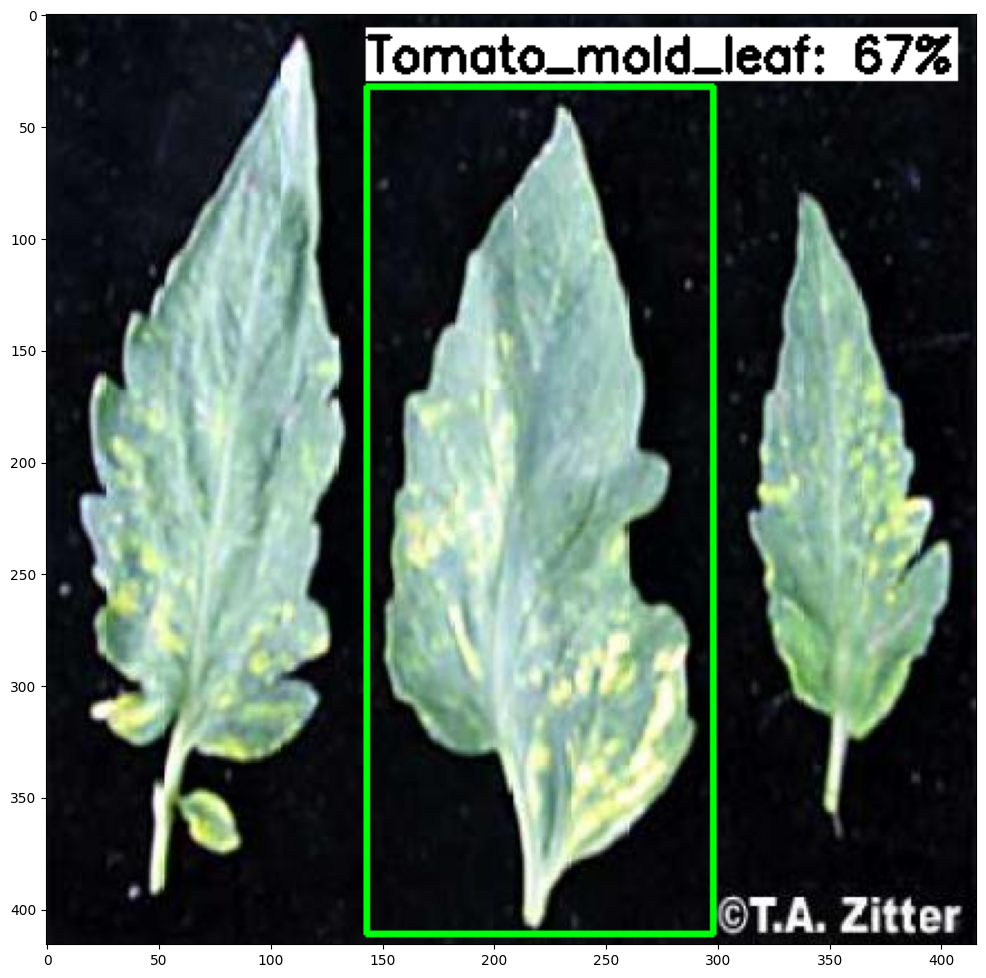

In [ ]:
# Set up variables for running user's model
PATH_TO_IMAGES='/content/images/test'
PATH_TO_MODEL='/content/lite_model/detect.tflite'
PATH_TO_LABELS='/content/labelmap.txt'
min_conf_threshold=0.5
images_to_test = 10

tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

**Calculate mAP**

In [ ]:
%%bash
git clone https://github.com/Cartucho/mAP /content/mAP
cd /content/mAP
rm input/detection-results/*
rm input/ground-truth/*
rm input/images-optional/*
wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py

Cloning into '/content/mAP'...
--2023-10-05 23:28:09--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5397 (5.3K) [text/plain]
Saving to: ‘calculate_map_cartucho.py’

     0K .....                                                 100% 34.0M=0s

2023-10-05 23:28:09 (34.0 MB/s) - ‘calculate_map_cartucho.py’ saved [5397/5397]



In [ ]:
!cp /content/images/test/* /content/mAP/input/images-optional # Copy images and xml files
!mv /content/mAP/input/images-optional/*.xml /content/mAP/input/ground-truth/  # Move xml files to the appropriate folder

In [ ]:
!python /content/mAP/scripts/extra/convert_gt_xml.py

Conversion completed!


In [ ]:
# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/images/test'
PATH_TO_MODEL='/content/lite_model/detect.tflite'
PATH_TO_LABELS='/content/labelmap.txt'
PATH_TO_RESULTS='/content/mAP/input/detection-results'
min_conf_threshold=0.1

# Use test images
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list))

txt_only = True

print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

Starting inference on 239 images...
Finished inferencing!


In [ ]:
%cd /content/mAP
!python calculate_map_cartucho.py --labels=/content/labelmap.txt

/content/mAP
Calculating mAP at 0.50 IoU threshold...
48.84% = Apple_Scab_Leaf AP 
66.25% = Apple_leaf AP 
54.55% = Apple_rust_leaf AP 
14.55% = Bell_pepper_leaf AP 
30.10% = Bell_pepper_leaf_spot AP 
48.65% = Blueberry_leaf AP 
30.83% = Cherry_leaf AP 
6.25% = Corn_Gray_leaf_spot AP 
45.14% = Corn_leaf_blight AP 
77.78% = Corn_rust_leaf AP 
96.36% = Peach_leaf AP 
23.53% = Potato_leaf_early_blight AP 
15.00% = Potato_leaf_late_blight AP 
60.98% = Raspberry_leaf AP 
58.33% = Soyabean_leaf AP 
75.00% = Squash_Powdery_mildew_leaf AP 
99.05% = Strawberry_leaf AP 
3.95% = Tomato_Early_blight_leaf AP 
47.79% = Tomato_Septoria_leaf_spot AP 
22.65% = Tomato_leaf AP 
10.71% = Tomato_leaf_bacterial_spot AP 
29.29% = Tomato_leaf_late_blight AP 
7.69% = Tomato_leaf_mosaic_virus AP 
45.25% = Tomato_leaf_yellow_virus AP 
5.62% = Tomato_mold_leaf AP 
81.43% = grape_leaf AP 
62.50% = grape_leaf_black_rot AP 
mAP = 43.26%
Calculating mAP at 0.55 IoU threshold...
48.84% = Apple_Scab_Leaf AP 
66.25% = A